In [169]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.datasets import make_classification

In [170]:
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=20)

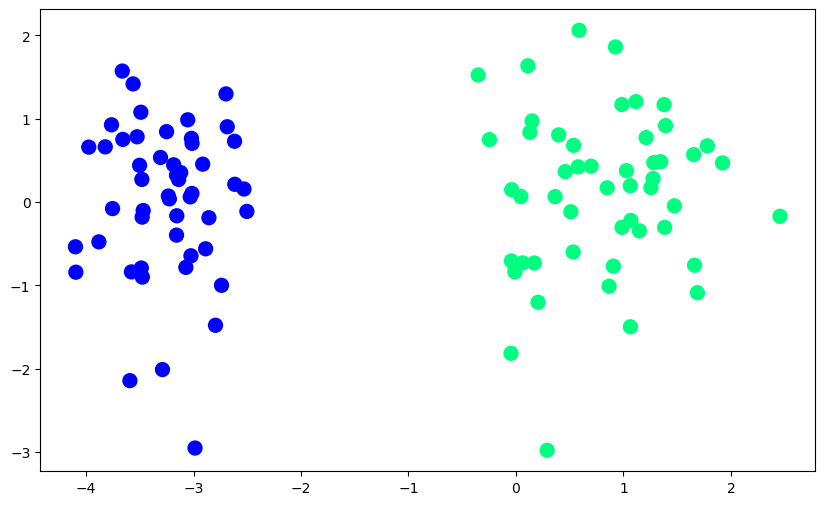

In [171]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.show()

In [172]:
X_new=np.insert(X,0,1,axis=1)

In [173]:
def perceptron(X,y):
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
    return weights[0],weights[1:]

In [174]:
def step(z):
    return 1 if z>0 else 0

In [175]:
from sklearn.linear_model import Perceptron
pt = Perceptron(eta0=0.1,max_iter=1000,random_state=42,)
pt.fit(X,y)
pt.coef_,pt.intercept_


(array([[0.12561371, 0.0173887 ]]), array([0.1]))

In [176]:
intercept_,coef_ = perceptron(X,y)

In [177]:
print(coef_)
print(intercept_)

[1.0198596  0.33857969]
1.3000000000000003


In [178]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [179]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

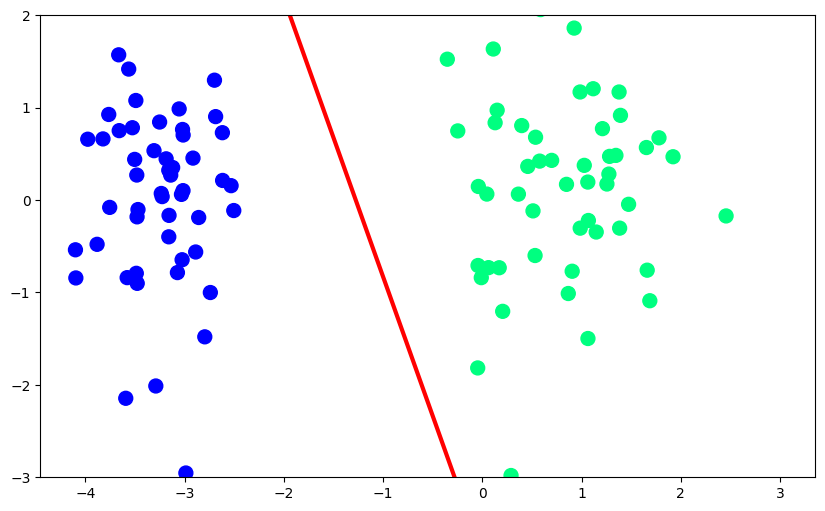

In [180]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)
plt.show()

In [181]:
def perceptron(X,y):
    
    m = []
    b = []
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
        
    return m,b

In [182]:
m,b = perceptron(X,y)

In [183]:
%matplotlib inline
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [184]:
from IPython.display import HTML

def update(i):
    line.set_ydata(x_i * m[i] + b[i])
    ax.set_xlabel(f"Epoch {i+1}")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(m),
    interval=100,
    repeat=True
)

HTML(anim.to_jshtml())

In [185]:
clf=LogisticRegression()
clf.fit(X,y)
clf.coef_,clf.intercept_

(array([[2.36679363, 0.02300492]]), array([3.13571596]))

In [186]:
m = -(clf.coef_[0][0]/clf.coef_[0][1])
b = -(clf.intercept_/clf.coef_[0][1])

In [187]:
m,b

(np.float64(-102.88205179540358), array([-136.30630349]))

In [188]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

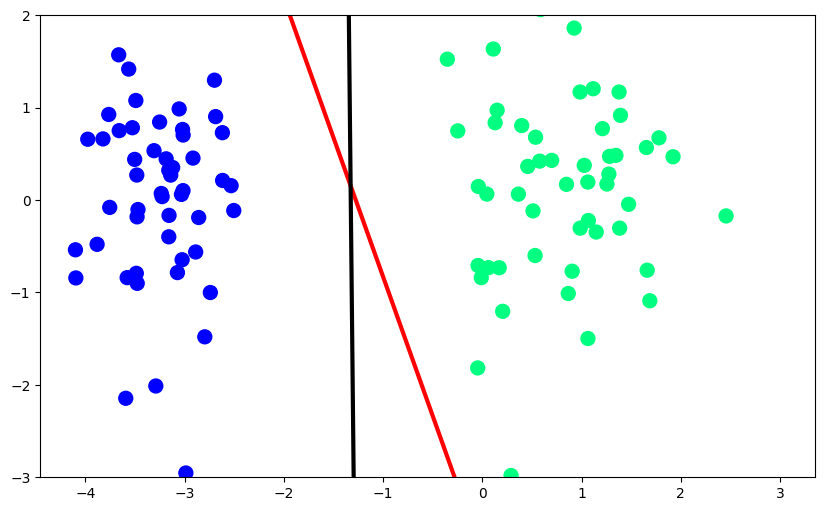

In [189]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)
plt.show()